▶ Case 1 / 16 | H2/CO2=2.00, T=700.00, u=0.20, P=7.50
[Champom] p_H2 = 5 | p_CO2 = 2.5 | Rate = -0.0004159
[Champom] p_H2 = 0.05833 | p_CO2 = 2.5 | Rate = -1.557e-05
[Champom] p_H2 = 0.05833 | p_CO2 = 0.3404 | Rate = 9.822e-06


C:\Users\pingu\anaconda3\Lib\site-packages\fipy\terms\term.py:195: UserWarning: sweep() or solve() are likely to produce erroneous results when `var` does not contain floats.
  solver = self._prepareLinearSystem(var, solver, boundaryConditions, dt)
C:\Users\pingu\anaconda3\Lib\site-packages\fipy\terms\term.py:123: UserWarning: sweep() or solve() are likely to produce erroneous results when `var` does not contain floats.
  self._checkVar(var)


[Champom] p_H2 = 0.05833 | p_CO2 = 0.3404 | Rate = 2.936e-05
[Champom] p_H2 = 0.05833 | p_CO2 = 0.3404 | Rate = 9.713e-06
z =  0.000 m | Tmax =   600.0 K
z =  0.833 m | Tmax =   600.0 K
[Koschany] p_H2 = 5 | p_CO2 = 2.5 | Rate = -2.834e-12
[Koschany] p_H2 = 5 | p_CO2 = 2.5 | Rate = -7.084e-13
[Koschany] p_H2 = 5 | p_CO2 = 2.5 | Rate = 7.084e-13
[Koschany] p_H2 = 5 | p_CO2 = 2.5 | Rate = 1.417e-12
[Koschany] p_H2 = 5 | p_CO2 = 2.5 | Rate = 0
z =  0.000 m | Tmax =   600.0 K
z =  0.833 m | Tmax =   600.0 K
[Kai] p_H2 = 5 | p_CO2 = 2.5 | Rate = -1.178e-06
[Kai] p_H2 = 4.032 | p_CO2 = 2.5 | Rate = -2.646e-07
[Kai] p_H2 = 4.032 | p_CO2 = 2.257 | Rate = 2.558e-07
[Kai] p_H2 = 4.032 | p_CO2 = 2.257 | Rate = 5.116e-07
[Kai] p_H2 = 4.032 | p_CO2 = 2.257 | Rate = 0
z =  0.000 m | Tmax =   600.0 K
z =  0.833 m | Tmax =   600.0 K
[Farsi] p_H2 = 5 | p_CO2 = 2.5 | Rate = -3.804e-15
[Farsi] p_H2 = 5 | p_CO2 = 2.5 | Rate = -1.593e-18
[Farsi] p_H2 = 5 | p_CO2 = 2.5 | Rate = 1.267e-15
[Farsi] p_H2 = 5 | 

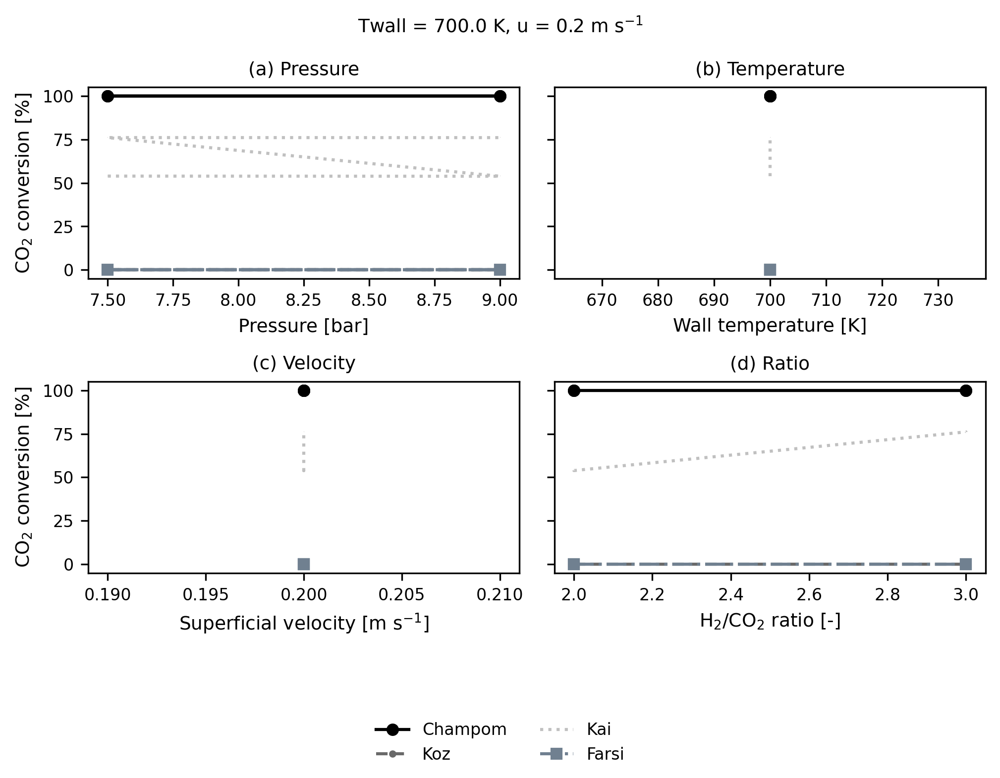

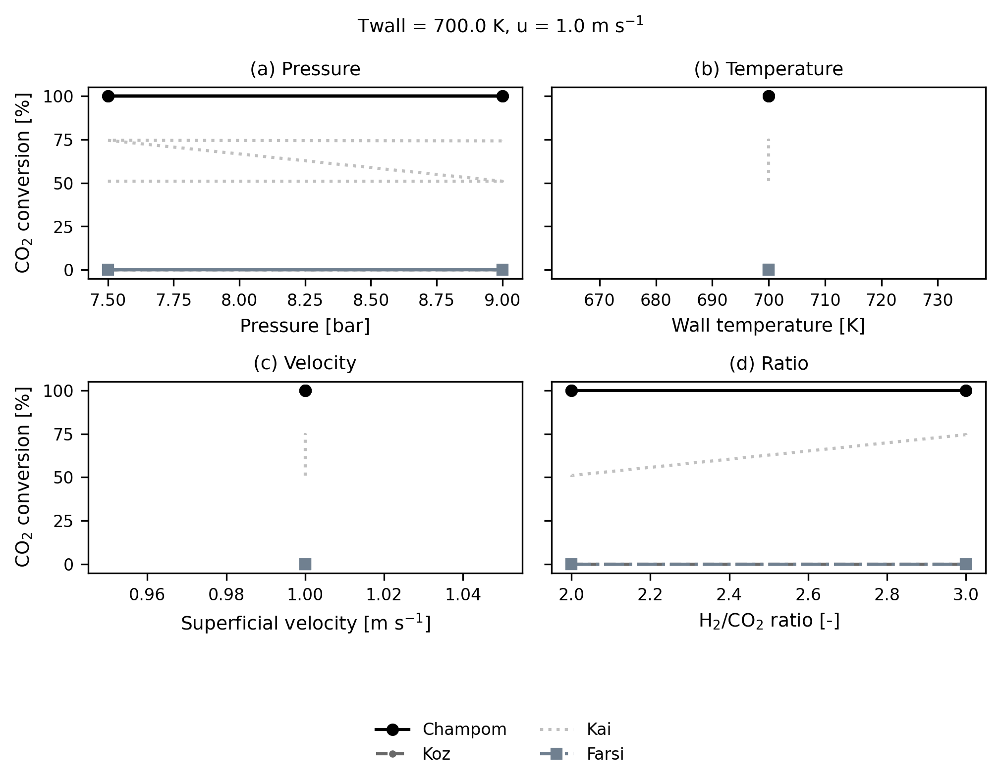

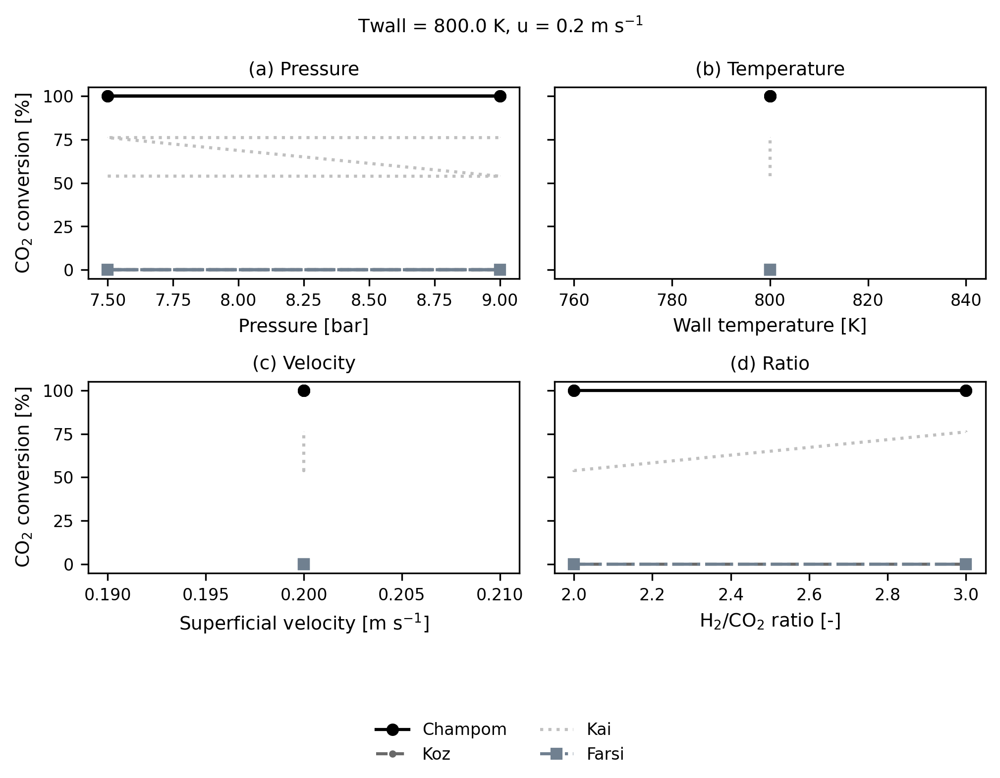

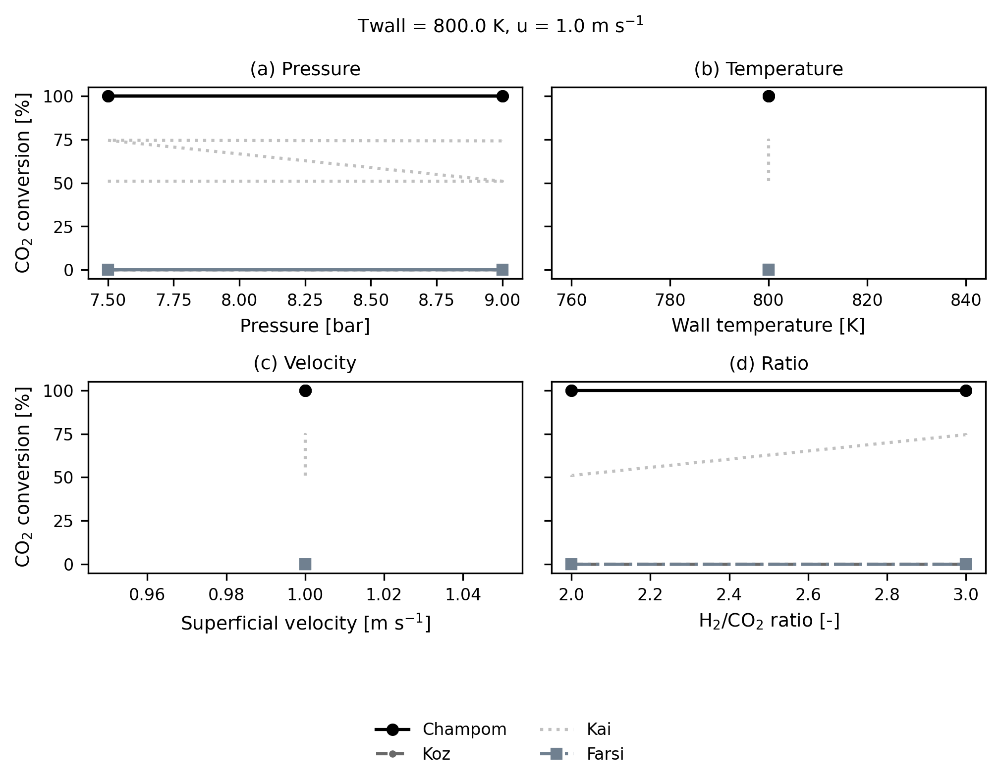

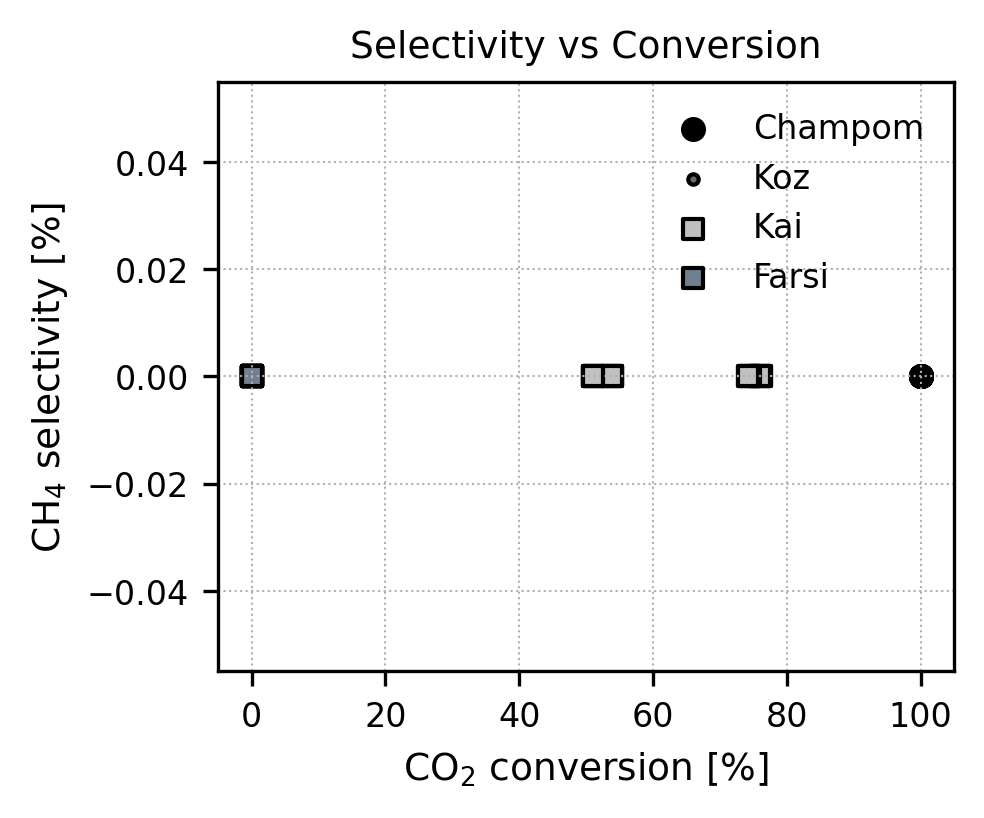

...

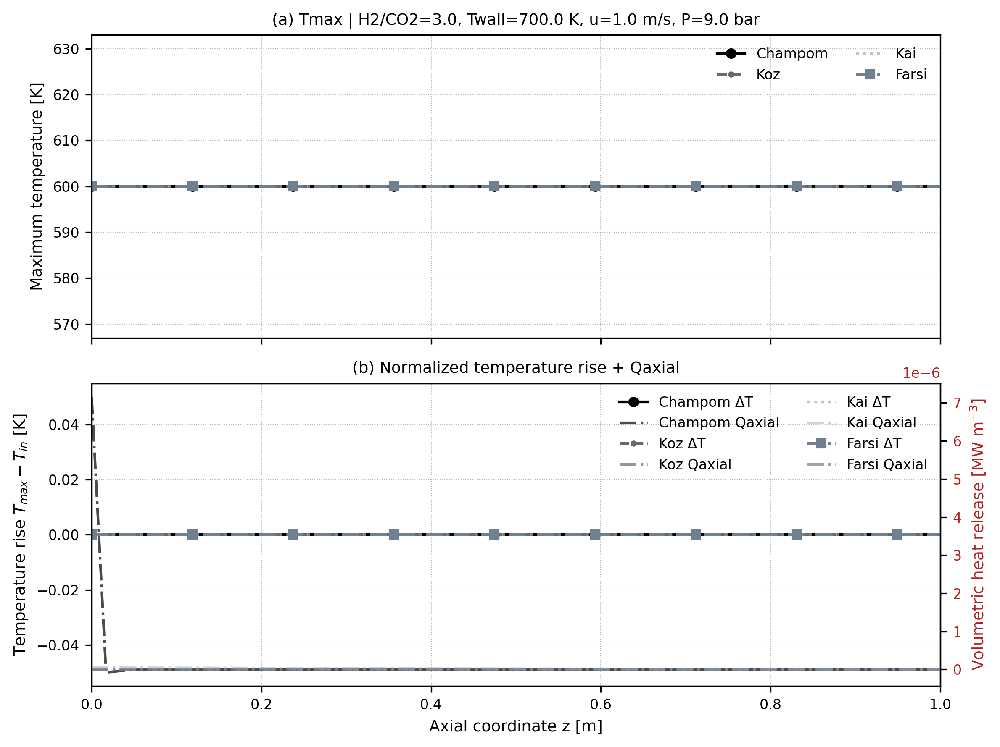

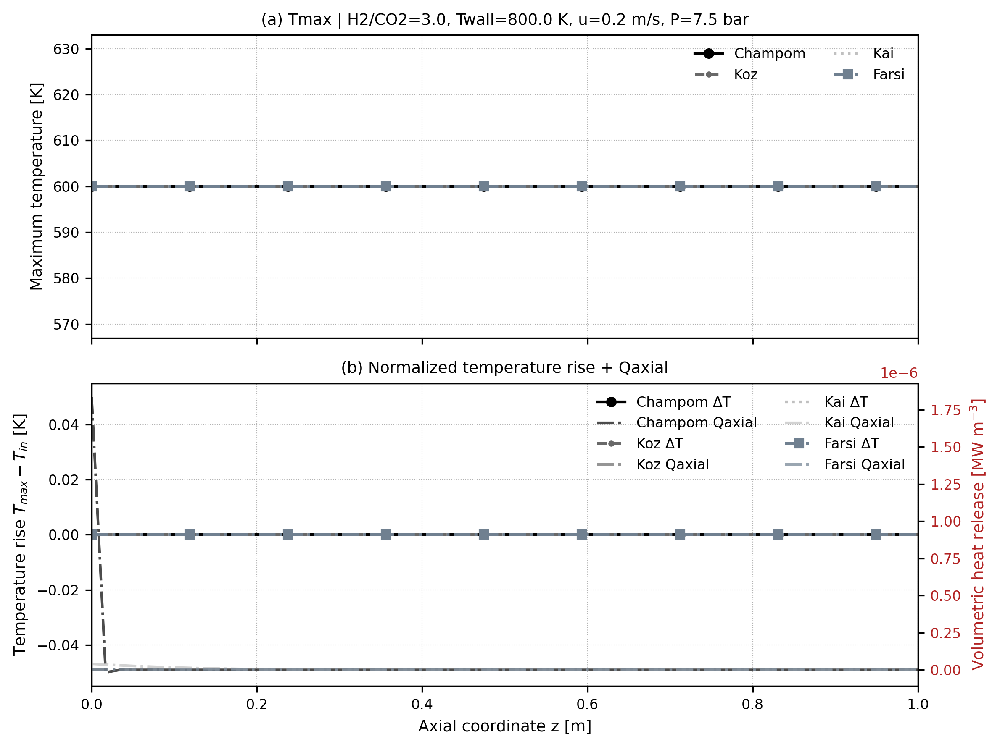

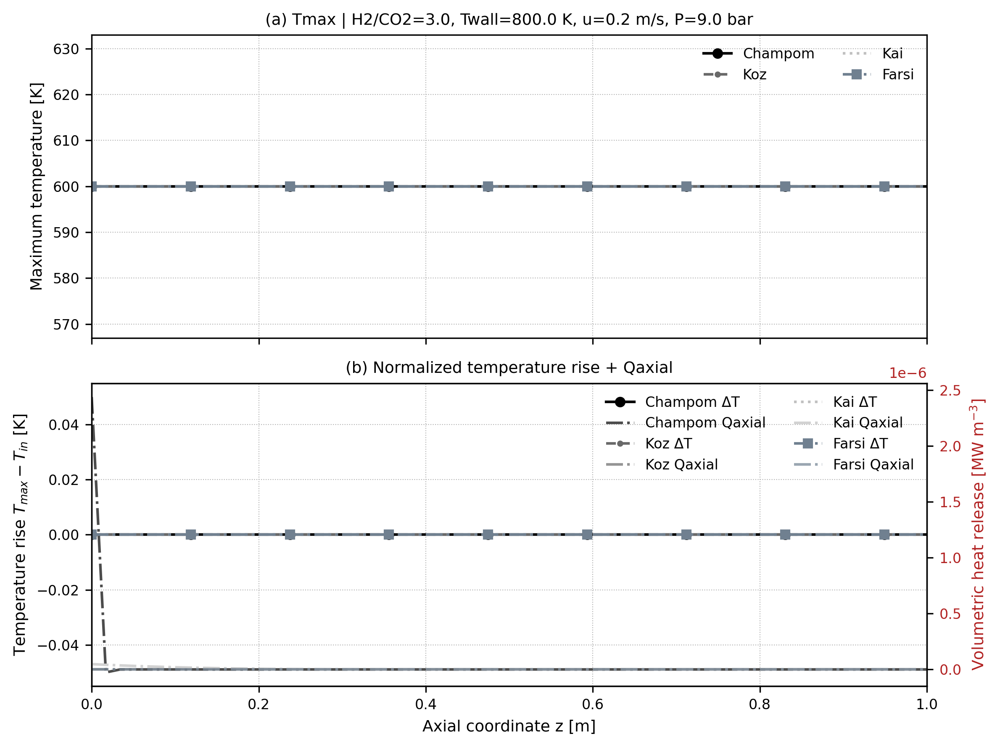

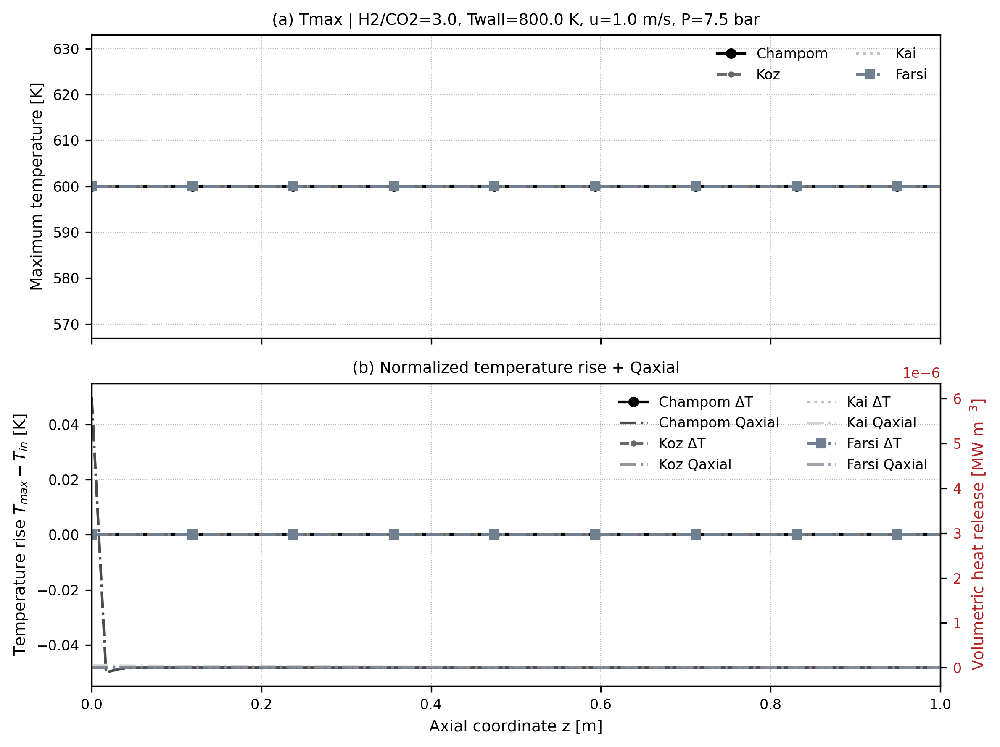

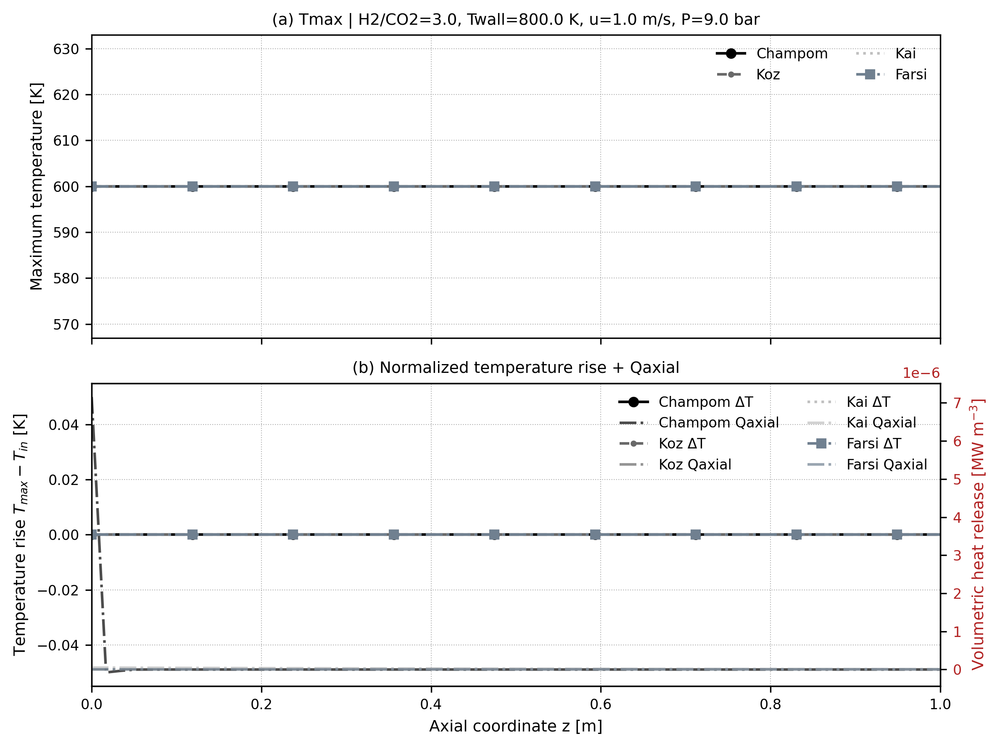

Column
    [0] HoloViews(NdOverlay, height=400, sizing_mode='fixed', widget_location='top', width=900)
    [1] HoloViews(NdOverlay, height=400, sizing_mode='fixed', widget_location='top', width=900)

In [16]:
# Reactor 2D 
from fipy import *
import numpy as np
import matplotlib.pyplot as plt
from fipy.tools import numerix
import pandas as pd
from fipy.terms import ImplicitSourceTerm
import hvplot.pandas
import panel as pn
pn.extension()


#Random equations for non-NaN results
def safe(x):
    return numerix.maximum(x, 1e-8)

def safe_exp(x):
    return numerix.exp(numerix.clip(x, -100, 100))

def safe_div(numer, denom, eps=1e-12):
    return numer / numerix.maximum(denom, eps)

def radial_avg(Cvar, Nr, Nz):
    """Return radial average along reactor length (axis=0 is radial)."""
    return np.mean(Cvar.reshape(Nr, Nz), axis=0)

#Species and their values
species = ["H2", "CO2", "CH4", "H2O", "CO"]

nu = {
    "H2":  [-4, -1, -3],
    "CO2": [-1, -1,  0],
    "CH4": [ 1,  0,  1],
    "H2O": [ 2,  1,  1],
    "CO":  [ 0,  1, -1]
}


#Kinectic Models - Champom 2019; Koschany 2016; Kai 1987; Farsi 2020
def champom_kinetics(p, T, k):
    T = numerix.clip(T, 300, 2000)

    kco2  = k["k0co2"]  * safe_exp(-k["eaco2"] / (R*T))
    krwgs = k["k0rwgs"] * safe_exp(-k["earwgs"] / (R*T))
    kco   = k["k0co"]   * safe_exp(-k["eaco"] / (R*T))

    Keq = 137* T**(-3.998) * safe_exp(158700/(R*T))
    Kco  = k["kads0co"]  * safe_exp(k["deltahco"]  / (R*T))
    Kh2  = k["kads0h2"]  * safe_exp(k["deltahh2"]  / (R*T))
    Kh2o = k["kads0h2o"] * safe_exp(k["deltahh2o"] / (R*T))
    Kco2 = k["kads0co2"] * safe_exp(k["deltahco2"] / (R*T))

    denom = 1 + Kh2 * p["H2"] + Kco2 * p["CO2"] + Kh2o * p["H2O"] + Kco * p["CO"]

    driving = safe_div(1 - (p["CH4"] * p["H2O"]**2) / (p["CO2"] * p["H2"]**4 * Keq), 1)
    driving = numerix.clip(driving, 0, 1)

    r1 = kco2 * Kh2 * Kco2 * p["H2"] * p["CO2"] * driving / numerix.maximum(denom**2, 1e-12)
    r2 = krwgs * p["CO2"] / numerix.maximum(denom, 1e-12)
    r3   = kco * p["CO"] * p["H2"] / numerix.maximum(denom**2, 1e-12)
    
    return [r1, r2, r3]

def koz_kinetics(p, T, k):
    T = numerix.clip(T, 300, 2000)

    kf = k["k0"] * safe_exp(-k["Ea"] / (R * T))
    
    Keq = 137 * T**(-3.998) * safe_exp(158700 / (R * T))
    K_OH  = safe_exp(k["Aoh"]  + (k["Boh"] / T))
    K_H2  = safe_exp(k["Ah2"]  + (k["Bh2"] / T))
    K_mix = safe_exp(k["Amix"] + (k["Bmix"] / T))

    driving = safe_div(1 - (p["CH4"] * p["H2O"]**2)/(p["CO2"] * p["H2"]**4 * Keq),1)
    driving = numerix.clip(driving,0,1)

    num = kf * p["H2"]**0.5 * p["CO2"]**0.5 * driving
    den = (1 + K_OH*(p["H2O"] / p["H2"]**0.5) + K_H2*p["H2"]**0.5 + K_mix*p["CO2"]**0.5)**2

    return safe_div(num, den), 0.0, 0.0

def kai_kinetics(p, T, k):
    T = numerix.clip(T, 300, 2000)

    kf = k["k0_kai"] * safe_exp(-k["Ea_kai"] / (R * T))
 
    Kh2kai  = safe_exp(k["kads_h2_kai"]  + (k["deltaH_h2_kai"] / (R * T)))
    Kco2kai  = safe_exp(k["kads_co2_kai"]  + (k["deltaH_co2_kai"] / (R * T)))
    Kh2okai = safe_exp(k["kads_h2o_kai"] + (k["deltaH_h2o_kai"] / (R * T)))

    denom = 1 + Kh2kai * (p["H2"]**(1/2)) + Kco2kai * (p["CO2"]**(1/2)) + Kh2okai * p["H2O"]

    r = kf * (p["H2"]**(1/2)) * (p["CO2"]**(1/3)) / numerix.maximum(denom**2, 1e-12)

    return r, 0.0, 0.0

def farsi_kinetics(p, T, k):

    # Temperature limits
    T = numerix.clip(T, 300.0, 2000.0)

    # === Arrhenius constants ===
    k1 = k["k0_1"] * numerix.exp(-k["ea_1"] / (R * T))
    k2 = k["k0_2"] * numerix.exp(-k["ea_2"] / (R * T))

    # === Adsorption constant (H2O) ===
    Kh2o = k["K_H2O_Farsi"] * numerix.exp(
        (k["ea_H2O_Farsi"] / R) * ((1.0 / 555.0) - (1.0 / T))
    )

    # === Equilibrium constants (FiPy-safe) ===
    ln10 = numerix.log(10.0)

    Kwgs = 1.0 / numerix.exp(
        (-2.4198 + 3.855e-4 * T + 2180.9 / T) * ln10
    )

    Kmeth = numerix.exp(
        (4.1002e-5 * T**2 - 0.08025 * T + 39.6039) * ln10
    )

    # === Total pressure (local) ===
    Ptot = sum(p[s] for s in p)
    
    # === Denominator ===
    denom = 1.0 + Kh2o * p["H2O"]
    denom2 = numerix.maximum(denom**2, 1e-12)

    # === Driving forces ===
    drivingWGS = 1.0 - (
        (p["CO"] * p["H2O"]) /
        (p["CO2"] * p["H2"]**4 * Kwgs + 1e-20)
    )
    drivingWGS = numerix.clip(drivingWGS, 0.0, 1.0)

    drivingMeth = 1.0 - (
        (p["CH4"] * p["H2O"]) #* Ptot**2) 
         /
        (p["CO"] * p["H2"]**3 * Kmeth + 1e-20)
    )
    drivingMeth = numerix.clip(drivingMeth, 0.0, 1.0)

    # === Rates ===
    r2 = k1 * (p["CO2"]**0.5) * (p["H2"]**0.5) * drivingWGS / denom2
    r3 = k2 * p["CO"] * (p["H2"]**0.5) * drivingMeth / denom2

    # r1 = 0 (not used in this mechanism)
    return [0.0 * T, r2, r3]

#Champom kinetics Parameters
kin_champom = dict(
    k0co2=1900000, eaco2=110000,
    k0rwgs=29666.66667, earwgs=97100,
    k0co=3716666.667, eaco=97300,
    kads0co=0.00239, deltahco=40600,
    kads0h2=0.000052, deltahh2=52000,
    kads0h2o=0.609, deltahh2o=14500,
    kads0co2=1.07, deltahco2=9720
)

#Koz kinetics Parameters
kin_koz = dict(
    k0=3.46e-4,
    Ea=77500,
    Aoh=0.5, Boh=-2694.25,
    Ah2=0.44, Bh2=745.73,
    Amix=0.88, Bmix=105.846
)

#Kai kinetics Parameters
kin_kai = dict(
    k0_kai=(9.32e3*(10**(2*(-5/6)))*10**(-3)),
    Ea_kai=72.5e3,
    kads_h2_kai=3.77e-10, deltaH_h2_kai=-90.2e3,
    kads_co2_kai=1.43e-3, deltaH_co2_kai=-29.5e3,
    kads_h2o_kai=2.75e-7, deltaH_h2o_kai=-64.3e3
)

#Farsi kinetics Parameters
kin_farsi = dict(
    k0_1=0.1425e-3, ea_1=166.55e3,
    k0_2=11.5451e-3, ea_2=60.98e3,
    K_H2O_Farsi=0.6782, ea_H2O_Farsi=11.44e3,
)
         
#Constants / Parameters
R = 8.314
rho_b = 2450
eps = 0.4
Dr = 1e-5
lambda_e = 0.8
dH = [-165e3, 41e3, -206e3]
Tin = 600
rhoCp = 1.5e6

#Reactor
def run_reactor(H2_CO2, Twall, u0, Pbar, kinetics, kin_params, kin_name):

    #Geometry of reactor and mesh
    Rr, Lz = 0.1, 1.0
    Nr, Nz = 20, 60
    mesh = CylindricalGrid2D(dr=Rr/Nr, dz=Lz/Nz, nr=Nr, nz=Nz)
    dz = Lz / Nz
    dtau = dz / u0

    #Conditions of inlet
    yCO2 = 1 / (1 + H2_CO2)
    yH2  = H2_CO2 * yCO2

    #Concentration at the beginning
    Cin = {
        "CO2": Pbar * yCO2 / (R * Tin),
        "H2":  Pbar * yH2  / (R * Tin),
        "CH4": 0,
        "CO":  0,
        "H2O": 0
    }
    
    # Conc and Temp as in the mesh
    C = {sp: CellVariable(mesh=mesh, value=Cin[sp], hasOld=True)
         for sp in species}
    
    T = CellVariable(mesh=mesh, value=Tin, hasOld=True)

    #BCs of Conc and Temp + Axial parameters
    for sp in species:
        C[sp].faceGrad.constrain(0, mesh.facesLeft)
        C[sp].faceGrad.constrain(0, mesh.facesRight)

    T.faceGrad.constrain(0, mesh.facesLeft)
    T.constrain(Twall, mesh.facesRight)

    Qaxial = []
    Tmax_axial = []

    #Axial starts
    for k in range(Nz):
        for sp in species:
            C[sp].updateOld()
        T.updateOld()

        #Recompute kinetics at this axial plane
        p = {s: safe(C[s] * R * T) for s in species}
        Ptot = sum(p[s] for s in species)
        rates = kinetics(p, T, kin_params)
        
    
      #MB of Species
        for sp in species:
            Rsp = sum(nu[sp][i] * rates[i] for i in range(3))
            
              #Fail-save for pressure at moment 0
            if k == 0:
                print(
                    f"[{kin_name}] "
                    f"p_H2 = {float(p['H2'].value.mean()):.4g} | "
                    f"p_CO2 = {float(p['CO2'].value.mean()):.4g} | "
                    f"Rate = {float(Rsp.value.mean()):.4g}"
                    )

            eq = (
                TransientTerm(var=C[sp])
                ==
                DiffusionTerm(coeff=eps * Dr, var=C[sp])
                + ImplicitSourceTerm(
                    coeff=rho_b * Rsp / (C[sp] + 1e-12),
                    var=C[sp]
                )
            )
            eq.solve(dt=dtau)

        #EB of Species
        Qrxn = sum(-dH[i] * rates[i] for i in range(3))

        energy = (
            TransientTerm(coeff=rhoCp, var=T)
            ==
            DiffusionTerm(coeff=lambda_e, var=T)
            + ImplicitSourceTerm(
                coeff=rho_b * Qrxn / (T + 1e-6),
                var=T
            )
        )
        energy.solve(dt=dtau)

        #Axial heat release (radial average at plane k)
        # reshape fields
        Qmat = Qrxn.value.reshape(Nz, Nr)
        Tmat = T.value.reshape(Nz, Nr)
        
        # axial averages
        Qaxial.append(Qmat[k, :].mean())
        Tmax_axial.append(Tmat[k, :].max())

        #Are we done yet?
        if k % 50 == 0:
            print(f"z = {k*dz:6.3f} m | Tmax = {T.value.max():7.1f} K")

    #Outlet conditions and information
    CO2_out = C["CO2"].value[-Nr:].mean()
    CH4_out = C["CH4"].value[-Nr:].mean()

    #Conversion and seletivity
    X = (Cin["CO2"] - CO2_out) / Cin["CO2"]
    S = CH4_out / (Cin["CO2"] - CO2_out + 1e-12)

    return X, S, T.value, np.array(Qaxial), np.array(Tmax_axial)


#The condtions that I can change
ratios = [2,3]
Twalls = [700,800]
vels = [0.2, 1.0]
pressures = [7.5, 9]

#PARAMETRIC SWEEP
results = []
profiles = []
Lz = 1.0
case = 0

#Knowing how many combinations do we have for the kinetics HOW MANY DO WE HAVE =?
total = len(ratios) * len(Twalls) * len(vels) * len(pressures)

#The beginning of the reaction altering ratio, Tw, u and P
for r in ratios:
    for Tw in Twalls:
        for u in vels:
            for P in pressures:
                case += 1
                print(f"▶ Case {case} / {total} | H2/CO2={r:.2f}, T={Tw:.2f}, u={u:.2f}, P={P:.2f}")

                Xc, Sc, Tc, Qaxialc, Tmaxc = run_reactor(r, Tw, u, P,
                                     champom_kinetics, kin_champom, "Champom")
                Xk, Sk, Tk, Qaxialk, Tmaxk = run_reactor(r, Tw, u, P,
                                     koz_kinetics, kin_koz, "Koschany")
                Xkai, Skai, Tkai, Qaxialkai, Tmaxkai = run_reactor(r, Tw, u, P,
                                     kai_kinetics, kin_kai, "Kai")
                Xfar, Sfar, Tfar, Qaxialfar, Tmaxfar = run_reactor(r, Tw, u, P,
                                                 farsi_kinetics, kin_farsi, "Farsi")
                profiles.append({ "kinetic": "Champom","H2_CO2": r,"Twall": Tw,"u0": u,"P": P,"Qaxial": Qaxialc,"Tmax": Tmaxc,"Tfield": Tc})
                profiles.append({"kinetic": "Koz","H2_CO2": r,"Twall": Tw,"u0": u,"P": P,"Qaxial": Qaxialk,"Tmax": Tmaxk,"Tfield": Tk})
                profiles.append({"kinetic": "Kai","H2_CO2": r,"Twall": Tw,"u0": u,"P": P,"Qaxial": Qaxialkai,"Tmax": Tmaxkai,"Tfield": Tkai})
                profiles.append({"kinetic": "Farsi","H2_CO2": r,"Twall": Tw,"u0": u,"P": P,"Qaxial": Qaxialfar,"Tmax": Tmaxfar,"Tfield": Tfar})

                results.append([r, Tw, u, P, Xc, Sc, Xk, Sk, Xkai, Skai, Xfar, Sfar])

#Results and profiles
profiles = pd.DataFrame(profiles)
results = pd.DataFrame(
    results,
    columns=["H2_CO2", "Twall", "u0", "P",
             "X_champom", "S_champom", "X_Koz", "S_Koz","X_Kai", "S_Kai","X_far", "S_far" ]
)

results



# PLOTS
# Convert conversion and selectivity to percent
results["X_ch_pct"] = results["X_champom"] * 100
results["X_koz_pct"] = results["X_Koz"] * 100
results["X_kai_pct"] = results["X_Kai"] * 100
results["X_far_pct"] = results["X_far"] * 100
results["S_ch_pct"] = results["S_champom"] * 100
results["S_koz_pct"] = results["S_Koz"] * 100
results["S_kai_pct"] = results["S_Kai"] * 100
results["S_far_pct"] = results["S_far"] * 100

#Plot styling 
plt.rcParams.update({
    "figure.figsize": (3.35, 2.8),
    "font.size": 9,
    "axes.labelsize": 9,
    "axes.titlesize": 9,
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "lines.linewidth": 1.5,
    "lines.markersize": 5,
    "axes.grid": False,
    "figure.dpi": 300
})

COLORS = {"Champom": "black", "Koz": "dimgray", "Kai": "silver", "Farsi": "slategray"}
MARKERS = {"Champom": "o", "Koz": ".", "Kai": ",", "Farsi": "s"}
LINESTYLES = {"Champom": "-", "Koz": "--", "Kai": ":", "Farsi": "-."}

#Generic sweep plot
def plot_sweep(ax, x, y, label):
    ax.plot(
        x, y,
        marker=MARKERS[label],
        linestyle=LINESTYLES[label],
        color=COLORS[label],
        label=label
    )

#Conversion vs Selectivity
def plot_selectivity_conversion(results):
    plt.figure(figsize=(3.35, 2.8))
    plt.scatter(results.X_ch_pct, results.S_ch_pct, marker="o", color="black", edgecolor="black", label="Champom")
    plt.scatter(results.X_koz_pct, results.S_koz_pct, marker=".",color="dimgray", edgecolor="black", label="Koz")
    plt.scatter(results.X_kai_pct, results.S_kai_pct, marker=",",color="silver", edgecolor="black", label="Kai")
    plt.scatter(results.X_far_pct, results.S_far_pct, marker="s",color="slategray", edgecolor="black", label="Farsi")
    plt.xlabel("CO$_2$ conversion [%]")
    plt.ylabel("CH$_4$ selectivity [%]")
    plt.title("Selectivity vs Conversion")
    plt.legend(frameon=False)
    plt.grid(True, linestyle=":", linewidth=0.5)
    plt.tight_layout()
    plt.show()

#Conversion sweeps for every parameter that was changed
def plot_conversion_sweeps(results):
    fixed_sets = results[["Twall", "u0"]].drop_duplicates().sort_values(["Twall", "u0"])
    for _, row in fixed_sets.iterrows():
        Tw, u = row.Twall, row.u0
        sub = results[(results.Twall == Tw) & (results.u0 == u)]
    
        fig, axes = plt.subplots(2, 2, figsize=(6.8, 5.2), sharey=True)
    
        # (a) Pressure
        plot_sweep(axes[0, 0], sub.P, sub.X_ch_pct, "Champom")
        plot_sweep(axes[0, 0], sub.P, sub.X_koz_pct, "Koz")
        plot_sweep(axes[0, 0], sub.P, sub.X_kai_pct, "Kai")
        plot_sweep(axes[0, 0], sub.P, sub.X_far_pct, "Farsi")
        axes[0, 0].set_xlabel("Pressure [bar]")
        axes[0, 0].set_ylabel("CO$_2$ conversion [%]")
        axes[0, 0].set_title("(a) Pressure")
    
        # (b) Wall temperature
        plot_sweep(axes[0, 1], sub.Twall, sub.X_ch_pct, "Champom")
        plot_sweep(axes[0, 1], sub.Twall, sub.X_koz_pct, "Koz")
        plot_sweep(axes[0, 1], sub.Twall, sub.X_kai_pct, "Kai")
        plot_sweep(axes[0, 1], sub.Twall, sub.X_far_pct, "Farsi")
        axes[0, 1].set_xlabel("Wall temperature [K]")
        axes[0, 1].set_title("(b) Temperature")
    
        # (c) Velocity
        plot_sweep(axes[1, 0], sub.u0, sub.X_ch_pct, "Champom")
        plot_sweep(axes[1, 0], sub.u0, sub.X_koz_pct, "Koz")
        plot_sweep(axes[1, 0], sub.u0, sub.X_kai_pct, "Kai")
        plot_sweep(axes[1, 0], sub.u0, sub.X_far_pct, "Farsi")
        axes[1, 0].set_xlabel("Superficial velocity [m s$^{-1}$]")
        axes[1, 0].set_ylabel("CO$_2$ conversion [%]")
        axes[1, 0].set_title("(c) Velocity")
    
        # (d) Ratio
        plot_sweep(axes[1, 1], sub.H2_CO2, sub.X_ch_pct, "Champom")
        plot_sweep(axes[1, 1], sub.H2_CO2, sub.X_koz_pct, "Koz")
        plot_sweep(axes[1, 1], sub.H2_CO2, sub.X_kai_pct, "Kai")
        plot_sweep(axes[1, 1], sub.H2_CO2, sub.X_far_pct, "Farsi")
        axes[1, 1].set_xlabel("H$_2$/CO$_2$ ratio [-]")
        axes[1, 1].set_title("(d) Ratio")
    
        # Shared legend
        handles, labels = axes[0, 0].get_legend_handles_labels()
        fig.legend(handles, labels, loc="lower center", ncol=2, frameon=False)
    
        fig.suptitle(f"Twall = {Tw} K, u = {u} m s$^{{-1}}$", fontsize=9)
        plt.tight_layout(rect=[0, 0.15, 1, 1])
        plt.show()

        
#Axial heat release and Tmax for each kinetic
def plot_axial_heat_and_T(profile, Lz=1.0):
    # Safely get Qaxial or Qc
    Q = profile.get("Qaxial")
    Q = np.atleast_1d(np.array(Q, dtype=float).ravel())

    Tmax = np.atleast_1d(np.array(profile["Tmax"], dtype=float).ravel())

    # Expand scalar if needed
    if Q.size == 1 and Tmax.size > 1:
        Q = np.full_like(Tmax, Q[0])
    if Tmax.size == 1 and Q.size > 1:
        Tmax = np.full_like(Q, Tmax[0])

    if len(Q) != len(Tmax):
        # If lengths mismatch, interpolate to match
        z_Q = np.linspace(0, Lz, len(Q))
        z_T = np.linspace(0, Lz, len(Tmax))
        Q = np.interp(z_T, z_Q, Q)
        z = z_T
    else:
        z = np.linspace(0, Lz, len(Q))

    fig, ax1 = plt.subplots(figsize=(3.35, 2.8))
    ax1.plot(z, Q / 1e6, color="black", linewidth=1.5, label="Heat release")
    ax1.set_xlabel("Axial coordinate z [m]")
    ax1.set_ylabel("Volumetric heat release [MW m$^{-3}$]")

    ax2 = ax1.twinx()
    ax2.plot(z, Tmax, "--", color="firebrick", linewidth=1.5, label="T$_{max}$")
    ax2.set_ylabel("Maximum temperature [K]", color="firebrick")
    ax2.tick_params(axis="y", labelcolor="firebrick")

    # Combined legend
    lines = ax1.get_lines() + ax2.get_lines()
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, frameon=False)

    title = (
        f"{profile['kinetic']} | H2/CO2={profile['H2_CO2']}, "
        f"Twall={profile['Twall']} K, u={profile['u0']} m/s, P={profile['P']} bar"
    )
    ax1.set_title(title)
    ax1.grid(True, linestyle=":", linewidth=0.5)
    plt.tight_layout()
    plt.show()


#Radial hotspot profile
def plot_radial_hotspot(profile, Rr=0.1, Nr=200, Nz=600):
    Tmax = np.atleast_1d(np.array(profile["Tmax"], dtype=float).ravel())
    Tc = np.atleast_1d(np.array(profile["Tfield"], dtype=float).ravel())

    # Ensure Tc matches expected size
    if Tc.size != Nr * Nz:
        # Resize / interpolate to match
        Tc = np.resize(Tc, (Nz * Nr))

    # Find axial index of hotspot
    k_hot = np.argmax(Tmax)
    Tmat = Tc.reshape(Nz, Nr)
    r = np.linspace(0, Rr, Nr)

    plt.figure(figsize=(3.35, 2.8))
    plt.plot(r * 1e3, Tmat[k_hot, :], color="black", linewidth=1.5)
    plt.xlabel("Radial coordinate r [mm]")
    plt.ylabel("Temperature [K]")
    plt.title(f"Radial profile at hotspot ({profile['kinetic']}, z ≈ {k_hot / Nz * Lz:.2f} m)")
    plt.grid(True, linestyle=":", linewidth=0.5)
    plt.tight_layout()
    plt.show()



def plot_all_profiles_combined(results, profiles, Lz=1.0, Rr=0.1, Nr=20, Nz=60, Tin=600):
    """
    Plots all the results from parametric sweep, including:
    - Conversion sweeps
    - Selectivity vs conversion
    - Axial temperature & heat release for all kinetics combined
    - Radial hotspot profiles for each kinetic
    """
    # 1️⃣ Conversion sweeps
    plot_conversion_sweeps(results)

    # 2️⃣ Selectivity vs conversion
    plot_selectivity_conversion(results)

    # 3️⃣ Axial + radial profiles
    fixed_sets = profiles[["H2_CO2", "Twall", "u0", "P"]].drop_duplicates()

    for _, row in fixed_sets.iterrows():
        H2_CO2 = row.H2_CO2
        Twall = row.Twall
        u0 = row.u0
        P = row.P

        # Filter profiles for this parameter set
        subset = profiles[
            (profiles.H2_CO2 == H2_CO2) &
            (profiles.Twall == Twall) &
            (profiles.u0 == u0) &
            (profiles.P == P)
        ]

        # --- Combined kinetics plot ---
        plt.figure(figsize=(5, 3.5))
        z = np.linspace(0, Lz, Nz)
        ax1 = plt.gca()
        ax2 = ax1.twinx()

        for _, prof in subset.iterrows():
            kinetic = prof["kinetic"]

            Tmax = np.atleast_1d(np.array(prof["Tmax"]))
            Tfield = np.atleast_1d(np.array(prof["Tfield"]))
            Tavg = Tfield.reshape(Nz, Nr).mean(axis=1)
            ΔT = Tmax - Tin
            Qaxial = np.atleast_1d(np.array(prof["Qaxial"]))

            ax1.plot(
                z, Tmax, '-', color=COLORS[kinetic], label=f'{kinetic} Tmax',
                marker=MARKERS[kinetic], markevery=max(Nz // 8, 1)
            )
            ax1.plot(z, Tavg, '--', color=COLORS[kinetic], label=f'{kinetic} Tavg')
            ax1.plot(z, ΔT, ':', color=COLORS[kinetic], label=f'{kinetic} ΔT')
            ax2.plot(z, Qaxial, '-.', color=COLORS[kinetic], label=f'{kinetic} Qaxial')

        ax1.set_xlabel("Axial coordinate z [m]")
        ax1.set_ylabel("Temperature [K]")
        ax2.set_ylabel("Reaction heat Q [W/m³]")
        ax1.set_title(f"H2/CO2={H2_CO2}, Twall={Twall}, u={u0}, P={P}")

        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines + lines2, labels + labels2, frameon=False, ncol=2)

        ax1.grid(True, linestyle=":", linewidth=0.5)
        plt.tight_layout()
        plt.show()

        # --- Radial hotspot profiles for each kinetic ---
        for _, prof in subset.iterrows():
            Tmax = np.atleast_1d(np.array(prof["Tmax"]))
            Tc = np.atleast_1d(np.array(prof["Tfield"]))

            if Tc.size != Nr * Nz:
                Tc = np.resize(Tc, (Nz * Nr))

            k_hot = np.argmax(Tmax)
            Tmat = Tc.reshape(Nz, Nr)
            r = np.linspace(0, Rr, Nr)

            plt.figure(figsize=(3.35, 2.8))
            plt.plot(r * 1e3, Tmat[k_hot, :], color=COLORS[prof["kinetic"]], linewidth=1.5,
                     label=f"{prof['kinetic']}")
            plt.xlabel("Radial coordinate r [mm]")
            plt.ylabel("Temperature [K]")
            plt.title(f"Radial profile at hotspot (z ≈ {k_hot / Nz * Lz:.2f} m)")
            plt.grid(True, linestyle=":", linewidth=0.5)
            plt.legend(frameon=False)
            plt.tight_layout()
            plt.show()


plot_all_profiles_combined(results, profiles, Lz=1.0, Rr=0.1, Nr=20, Nz=60, Tin=600)

def plot_two_panel_temperature_qaxial_sweep_bigger(profiles, Tin=600, Lz=1.0, Nr=20, Nz=60):
    """
    Two-panel Tmax / ΔT + Qaxial figures for all unique combinations of H2_CO2, Twall, u0, P.
    Produces one figure per parameter combination.

    Top panel: Tmax vs z for all kinetics
    Bottom panel: ΔT vs z (Tmax - Tin) with Qaxial on single secondary y-axis
    """

    # Unique combinations
    unique_sets = profiles[["H2_CO2", "Twall", "u0", "P"]].drop_duplicates()

    for _, row in unique_sets.iterrows():
        H2_CO2 = row.H2_CO2
        Twall = row.Twall
        u0 = row.u0
        P = row.P

        subset = profiles[
            (profiles.H2_CO2 == H2_CO2) &
            (profiles.Twall == Twall) &
            (profiles.u0 == u0) &
            (profiles.P == P)
        ]

        # ---- Bigger figure ----
        fig, axes = plt.subplots(
            2, 1,
            figsize=(6.8, 7.0),  # double width & height
            sharex=True
        )

        # Single secondary y-axis for Qaxial
        ax2 = axes[1].twinx()
        ax2.set_ylabel("Volumetric heat release [MW m$^{-3}$]", color="firebrick")
        ax2.tick_params(axis="y", labelcolor="firebrick")
        ax2.grid(False)

        for _, prof in subset.iterrows():
            kinetic = prof["kinetic"]
            Tmax = np.atleast_1d(np.array(prof["Tmax"]))
            Qaxial = np.atleast_1d(np.array(prof["Qaxial"]))
            z = np.linspace(0, Lz, len(Tmax))

            # ---- Top panel: Tmax ----
            axes[0].plot(
                z, Tmax,
                color=COLORS[kinetic],
                linestyle=LINESTYLES[kinetic],
                marker=MARKERS[kinetic],
                markevery=max(len(z)//8, 1),
                label=kinetic
            )

            # ---- Bottom panel: ΔT ----
            axes[1].plot(
                z, Tmax - Tin,
                color=COLORS[kinetic],
                linestyle=LINESTYLES[kinetic],
                marker=MARKERS[kinetic],
                markevery=max(len(z)//8, 1),
                label=f"{kinetic} ΔT"
            )

            # ---- Qaxial ----
            ax2.plot(
                z, Qaxial / 1e6,  # W/m³ → MW/m³
                color=COLORS[kinetic],
                linestyle='-.',
                alpha=0.7,
                label=f"{kinetic} Qaxial"
            )

        # ---------- Formatting ----------
        axes[0].set_ylabel("Maximum temperature [K]")
        axes[0].set_title(f"(a) Tmax | H2/CO2={H2_CO2}, Twall={Twall} K, u={u0} m/s, P={P} bar")

        axes[1].set_ylabel("Temperature rise $T_{max}-T_{in}$ [K]")
        axes[1].set_xlabel("Axial coordinate z [m]")
        axes[1].set_title("(b) Normalized temperature rise + Qaxial")
        axes[1].set_xlim(0, Lz)

        for ax in axes:
            ax.grid(True, linestyle=":", linewidth=0.5)

        # ---------- Legend outside the plot ----------
        lines, labels = axes[1].get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        fig.legend(
            lines + lines2,
            labels + labels2,
            loc='upper center',  # place above the axes
            bbox_to_anchor=(0.5, 1.02),  # slightly above figure
            ncol=2,
            frameon=False
        )

        plt.tight_layout()
        plt.show()

plot_two_panel_temperature_qaxial_sweep_clean(
    profiles,
    Tin=600,
    Lz=1.0,
    Nr=20,
    Nz=60
)



def interactive_two_panel_temperature(profiles, Tin=600, Lz=1.0, kinetic_filter=None):
    """
    Two-panel interactive figure:
    (a) Tmax vs z
    (b) Temperature rise (Tmax - Tin) vs z
    Supports sweeping H2_CO2, Twall, u0, P.

    Parameters:
        profiles : pd.DataFrame
            Must contain columns: kinetic, H2_CO2, Twall, u0, P, Tmax (list/array)
        Tin : float
            Inlet temperature
        Lz : float
            Reactor length
        kinetic_filter : str or None
            Filter a specific kinetic model
    Returns:
        panel layout with two interactive plots
    """

    # Filter by kinetic if requested
    df = profiles.copy()
    if kinetic_filter:
        df = df[df["kinetic"] == kinetic_filter]

    # Flatten Tmax into a long DataFrame
    rows = []
    for _, row in df.iterrows():
        Tmax_arr = np.array(row["Tmax"])
        Nz = len(Tmax_arr)
        z = np.linspace(0, Lz, Nz)
        for zi, Ti in zip(z, Tmax_arr):
            rows.append({
                "z": zi,
                "Tmax": Ti,
                "DeltaT": Ti - Tin,
                "H2_CO2": row["H2_CO2"],
                "Twall": row["Twall"],
                "u0": row["u0"],
                "P": row["P"],
                "kinetic": row["kinetic"]
            })

    df_long = pd.DataFrame(rows)

    # ---------------- Panel (a): Tmax ----------------
    plot_Tmax = df_long.hvplot.line(
        x="z",
        y="Tmax",
        by="kinetic",
        width=900,
        height=400,
        hover_cols=["H2_CO2", "Twall", "u0", "P"],
        title="(a) Maximum Temperature along Reactor",
        widget_location="top"
    )

    # ---------------- Panel (b): DeltaT ----------------
    plot_dT = df_long.hvplot.line(
        x="z",
        y="DeltaT",
        by="kinetic",
        width=900,
        height=400,
        hover_cols=["H2_CO2", "Twall", "u0", "P"],
        title="(b) Temperature Rise ΔT = Tmax - Tin",
        widget_location="top"
    )

    # Stack vertically
    layout = pn.Column(plot_Tmax, plot_dT)
    return layout

interactive_two_panel_temperature(profiles, Tin=600, Lz=1.0)

In [12]:
import pandas as pd
import numpy as np
import hvplot.pandas
import panel as pn
pn.extension()

def interactive_two_panel_temperature(profiles, Tin=600, Lz=1.0, kinetic_filter=None):
    """
    Two-panel interactive figure:
    (a) Tmax vs z
    (b) Temperature rise (Tmax - Tin) vs z
    Supports sweeping H2_CO2, Twall, u0, P.

    Parameters:
        profiles : pd.DataFrame
            Must contain columns: kinetic, H2_CO2, Twall, u0, P, Tmax (list/array)
        Tin : float
            Inlet temperature
        Lz : float
            Reactor length
        kinetic_filter : str or None
            Filter a specific kinetic model
    Returns:
        panel layout with two interactive plots
    """

    # Filter by kinetic if requested
    df = profiles.copy()
    if kinetic_filter:
        df = df[df["kinetic"] == kinetic_filter]

    # Flatten Tmax into a long DataFrame
    rows = []
    for _, row in df.iterrows():
        Tmax_arr = np.array(row["Tmax"])
        Nz = len(Tmax_arr)
        z = np.linspace(0, Lz, Nz)
        for zi, Ti in zip(z, Tmax_arr):
            rows.append({
                "z": zi,
                "Tmax": Ti,
                "DeltaT": Ti - Tin,
                "H2_CO2": row["H2_CO2"],
                "Twall": row["Twall"],
                "u0": row["u0"],
                "P": row["P"],
                "kinetic": row["kinetic"]
            })

    df_long = pd.DataFrame(rows)

    # ---------------- Panel (a): Tmax ----------------
    plot_Tmax = df_long.hvplot.line(
        x="z",
        y="Tmax",
        by="kinetic",
        width=900,
        height=400,
        hover_cols=["H2_CO2", "Twall", "u0", "P"],
        title="(a) Maximum Temperature along Reactor",
        widget_location="top"
    )

    # ---------------- Panel (b): DeltaT ----------------
    plot_dT = df_long.hvplot.line(
        x="z",
        y="DeltaT",
        by="kinetic",
        width=900,
        height=400,
        hover_cols=["H2_CO2", "Twall", "u0", "P"],
        title="(b) Temperature Rise ΔT = Tmax - Tin",
        widget_location="top"
    )

    # Stack vertically
    layout = pn.Column(plot_Tmax, plot_dT)
    return layout

interactive_two_panel_temperature(profiles, Tin=600, Lz=1.0)


Column
    [0] HoloViews(NdOverlay, height=400, sizing_mode='fixed', widget_location='top', width=900)
    [1] HoloViews(NdOverlay, height=400, sizing_mode='fixed', widget_location='top', width=900)